# Projet 2 : Préparez des données pour un organisme de santé publique (NB 0: Brouillon)
  <!-- AUTHOR : Anthony DAVID -->

**Mission :** L'agence Santé publique France souhaite améliorer sa base de données Open Food Facts en prédisant les valeurs manquantes. Notre mission sera de nettoyer et explorer les données puis de prédire les valeurs manquantes et de réaliser des visualisations en vu d'une présentation finale.

**Jeu de données :** Le jeu de données Open Food Facts est disponible sur le [site officiel](https://world.openfoodfacts.org/) (ou disponible à [ce lien](https://s3-eu-west-1.amazonaws.com/static.oc-static.com/prod/courses/files/parcours-data-scientist/P2/fr.openfoodfacts.org.products.csv.zip) en téléchargement). Les variables sont définies à [cette adresse](https://world.openfoodfacts.org/data/data-fields.txt). Les champs sont séparés en quatre sections :
- Les informations générales sur la fiche du produit : nom, date de modification, etc.
- Un ensemble de tags : catégorie du produit, localisation, origine, etc.
- Les ingrédients composant les produits et leurs additifs éventuels.
- Des informations nutritionnelles : quantité en grammes d’un nutriment pour 100 grammes du produit.

In [1]:
import pandas as pd
import missingno as msno
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.impute import KNNImputer

## Première exploration et nettoyage des données

In [2]:
df_0 = pd.read_csv("P2_data.csv", low_memory=False, delimiter='\t')

In [3]:
# Fonction pour calculer le taux de valeurs manquantes des colonnes
def nan_percentage_by_columns(df):
    tx = df.isnull().sum(axis = 0) / df.shape[0] * 100.00
    tx = tx.transform(lambda x: '{:02.2f}'.format(x)+' %')
    return tx

### Informations sur le dataset

In [4]:
df = df_0.copy()

In [5]:
df.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df.shape

(320772, 162)

In [7]:
print(f'The number of rows in the DataFrame is: {df.shape[0]}')

The number of rows in the DataFrame is: 320772


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Columns: 162 entries, code to water-hardness_100g
dtypes: float64(106), object(56)
memory usage: 396.5+ MB


In [9]:
df.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name',
       'generic_name', 'quantity',
       ...
       'ph_100g', 'fruits-vegetables-nuts_100g',
       'collagen-meat-protein-ratio_100g', 'cocoa_100g', 'chlorophyl_100g',
       'carbon-footprint_100g', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g', 'glycemic-index_100g',
       'water-hardness_100g'],
      dtype='object', length=162)

In [10]:
df_0.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 162 columns):
 #    Column                                      Dtype  
---   ------                                      -----  
 0    code                                        object 
 1    url                                         object 
 2    creator                                     object 
 3    created_t                                   object 
 4    created_datetime                            object 
 5    last_modified_t                             object 
 6    last_modified_datetime                      object 
 7    product_name                                object 
 8    generic_name                                object 
 9    quantity                                    object 
 10   packaging                                   object 
 11   packaging_tags                              object 
 12   brands                                      object 
 13   brands_tags 

In [11]:
nan_percentage_by_columns(df_0)

code                         0.01 %
url                          0.01 %
creator                      0.00 %
created_t                    0.00 %
created_datetime             0.00 %
                             ...   
carbon-footprint_100g       99.92 %
nutrition-score-fr_100g     31.04 %
nutrition-score-uk_100g     31.04 %
glycemic-index_100g        100.00 %
water-hardness_100g        100.00 %
Length: 162, dtype: object

In [12]:
df.describe()

,no_nutriments,additives_n,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,nutrition_grade_uk,energy_100g,energy-from-fat_100g,fat_100g,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
count,0.0,248939.000000,248939.000000,0.0,248939.000000,0.0,0.0,2.611130e+05,857.000000,243891.000000,...,49.000000,3036.000000,165.000000,948.000000,0.0,268.000000,221210.000000,221210.000000,0.0,0.0
mean,NaN,1.936024,0.019659,NaN,0.055246,NaN,NaN,1.141915e+03,585.501214,12.730379,...,6.425698,31.458587,15.412121,49.547785,NaN,341.700764,9.165535,9.058049,NaN,NaN
std,NaN,2.502019,0.140524,NaN,0.269207,NaN,NaN,6.447154e+03,712.809943,17.578747,...,2.047841,31.967918,3.753028,18.757932,NaN,425.211439,9.055903,9.183589,NaN,NaN
min,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,0.000000e+00,0.000000,0.000000,...,0.000000,0.000000,8.000000,6.000000,NaN,0.000000,-15.000000,-15.000000,NaN,NaN
25%,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,3.770000e+02,49.400000,0.000000,...,6.300000,0.000000,12.000000,32.000000,NaN,98.750000,1.000000,1.000000,NaN,NaN
50%,NaN,1.000000,0.000000,NaN,0.000000,NaN,NaN,1.100000e+03,300.000000,5.000000,...,7.200000,23.000000,15.000000,50.000000,NaN,195.750000,10.000000,9.000000,NaN,NaN
75%,NaN,3.000000,0.000000,NaN,0.000000,NaN,NaN,1.674000e+03,898.000000,20.000000,...,7.400000,51.000000,15.000000,64.250000,NaN,383.200000,16.000000,16.000000,NaN,NaN
max,NaN,31.000000,2.000000,NaN,6.000000,NaN,NaN,3.251373e+06,3830.000000,714.290000,...,8.400000,100.000000,25.000000,100.000000,NaN,2842.000000,40.000000,40.000000,NaN,NaN


<Axes: >

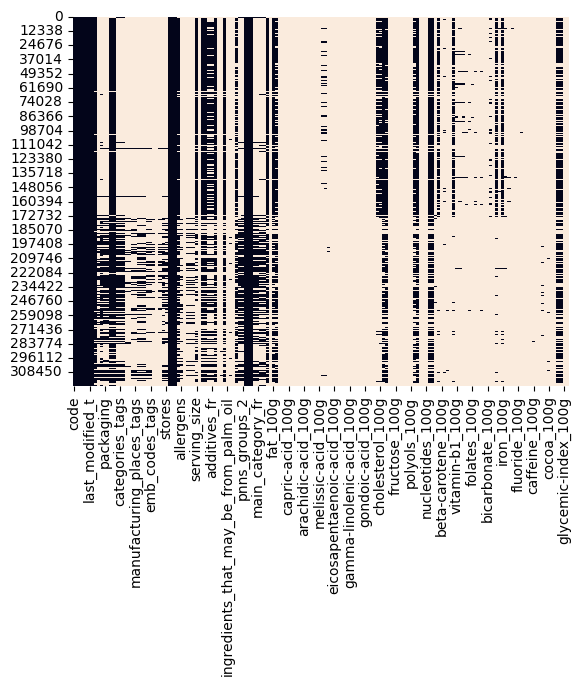

In [13]:
sns.heatmap(df_0.isnull(), cbar=False)

<Axes: >

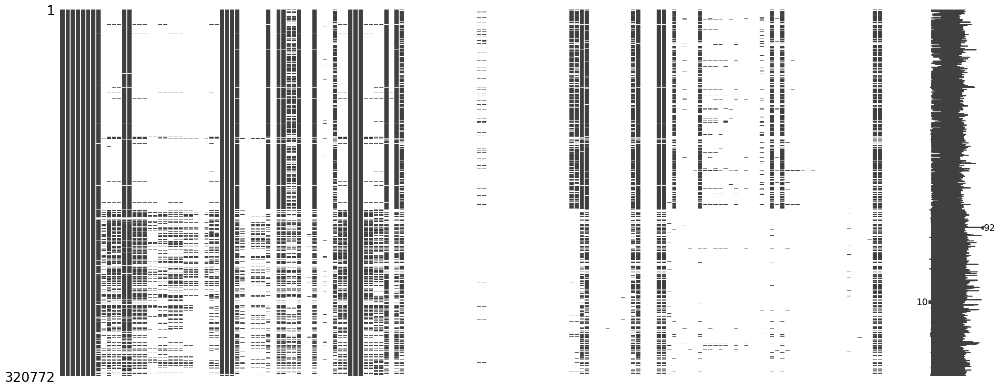

In [14]:
msno.matrix(df)

### Suppression des colonnes ayant plus de 50% de valeurs manquantes et inspection des colonnes restantes

In [15]:
threshold = 0.5 * len(df)
df = df.dropna(axis=1, thresh=threshold)

In [16]:
# show all columns
pd.set_option('display.max_columns', None) # sh

In [17]:
df.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name', 'brands',
       'brands_tags', 'countries', 'countries_tags', 'countries_fr',
       'ingredients_text', 'serving_size', 'additives_n', 'additives',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'states', 'states_tags', 'states_fr', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g'],
      dtype='object')

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 34 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   code                                     320749 non-null  object 
 1   url                                      320749 non-null  object 
 2   creator                                  320770 non-null  object 
 3   created_t                                320769 non-null  object 
 4   created_datetime                         320763 non-null  object 
 5   last_modified_t                          320772 non-null  object 
 6   last_modified_datetime                   320772 non-null  object 
 7   product_name                             303010 non-null  object 
 8   brands                                   292360 non-null  object 
 9   brands_tags                              292352 non-null  object 
 10  countries                       

In [19]:
df.head(500)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,brands,brands_tags,countries,countries_tags,countries_fr,ingredients_text,serving_size,additives_n,additives,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,states,states_tags,states_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,Ferme t'y R'nao,ferme-t-y-r-nao,en:FR,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,US,en:united-states,États-Unis,"Bananas, vegetable oil (coconut oil, corn oil ...",28 g (1 ONZ),0.0,[ bananas -> en:bananas ] [ vegetable-oil -...,0.0,0.0,d,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",2243.0,28.57,28.57,64.29,14.29,3.6,3.57,0.00000,0.000000,14.0,14.0
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,Torn & Glasser,torn-glasser,US,en:united-states,États-Unis,"Peanuts, wheat flour, sugar, rice flour, tapio...",28 g (0.25 cup),0.0,[ peanuts -> en:peanuts ] [ wheat-flour -> ...,0.0,0.0,b,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",1941.0,17.86,0.00,60.71,17.86,7.1,17.86,0.63500,0.250000,0.0,0.0
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,Grizzlies,grizzlies,US,en:united-states,États-Unis,"Organic hazelnuts, organic cashews, organic wa...",28 g (0.25 cup),0.0,[ organic-hazelnuts -> en:organic-hazelnuts ...,0.0,0.0,d,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",2540.0,57.14,5.36,17.86,3.57,7.1,17.86,1.22428,0.482000,12.0,12.0
4,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,Bob's Red Mill,bob-s-red-mill,US,en:united-states,États-Unis,Organic polenta,35 g (0.25 cup),0.0,[ organic-polenta -> en:organic-polenta ] [...,0.0,0.0,NaN,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",1552.0,1.43,NaN,77.14,NaN,5.7,8.57,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0002000003395,http://world-fr.openfoodfacts.org/produit/0002...,kiliweb,1485978144,2017-02-01T19:42:24Z,1485978145,2017-02-01T19:42:25Z,Black & White Crispbread Sticks,Swedish By Nature,swedish-by-nature,France,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,d,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",1674.0,NaN,1.80,NaN,5.50,10.0,15.00,2.40000,0.944882,11.0,11.0
496,0002000003913,http://world-fr.openfoodfacts.org/produit/0002...,teolemon,1452692774,2016-01-13T13:46:14Z,1452692776,2016-01-13T13:46:16Z,NaN,NaN,NaN,en:FR,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-

In [20]:
nan_percentage_by_columns(df)

code                                        0.01 %
url                                         0.01 %
creator                                     0.00 %
created_t                                   0.00 %
created_datetime                            0.00 %
last_modified_t                             0.00 %
last_modified_datetime                      0.00 %
product_name                                5.54 %
brands                                      8.86 %
brands_tags                                 8.86 %
countries                                   0.09 %
countries_tags                              0.09 %
countries_fr                                0.09 %
ingredients_text                           22.39 %
serving_size                               34.12 %
additives_n                                22.39 %
additives                                  22.40 %
ingredients_from_palm_oil_n                22.39 %
ingredients_that_may_be_from_palm_oil_n    22.39 %
nutrition_grade_fr             

### Sélection des colonnes relevantes

La mission principale de Santé publique France étant de permettre de connaître la qualité nutritionnelle de produits, concentrons nous sur les colonnes qui apportent une information sur la qualité nutritionnelle. Gardons également le code, la date de modification, ainsi que la date de dernière modification., le nom du produit, et les pays de distribution.

In [21]:
df2 = df[['code', 'created_datetime','last_modified_datetime',\
                        'product_name','countries','ingredients_text',\
                        'nutrition_grade_fr','energy_100g','fat_100g',\
                        'saturated-fat_100g','carbohydrates_100g','sugars_100g',\
                        'fiber_100g','proteins_100g','salt_100g',\
                        'sodium_100g','nutrition-score-fr_100g']]

In [22]:
nan_percentage_by_columns(df2)

code                        0.01 %
created_datetime            0.00 %
last_modified_datetime      0.00 %
product_name                5.54 %
countries                   0.09 %
ingredients_text           22.39 %
nutrition_grade_fr         31.04 %
energy_100g                18.60 %
fat_100g                   23.97 %
saturated-fat_100g         28.44 %
carbohydrates_100g         24.06 %
sugars_100g                23.63 %
fiber_100g                 37.37 %
proteins_100g              18.97 %
salt_100g                  20.35 %
sodium_100g                20.36 %
nutrition-score-fr_100g    31.04 %
dtype: object

In [23]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 17 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   code                     320749 non-null  object 
 1   created_datetime         320763 non-null  object 
 2   last_modified_datetime   320772 non-null  object 
 3   product_name             303010 non-null  object 
 4   countries                320492 non-null  object 
 5   ingredients_text         248962 non-null  object 
 6   nutrition_grade_fr       221210 non-null  object 
 7   energy_100g              261113 non-null  float64
 8   fat_100g                 243891 non-null  float64
 9   saturated-fat_100g       229554 non-null  float64
 10  carbohydrates_100g       243588 non-null  float64
 11  sugars_100g              244971 non-null  float64
 12  fiber_100g               200886 non-null  float64
 13  proteins_100g            259922 non-null  float64
 14  salt

In [24]:
df2.describe()

,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
count,2.611130e+05,243891.000000,229554.000000,243588.000000,244971.000000,200886.000000,259922.000000,255510.000000,255463.000000,221210.000000
mean,1.141915e+03,12.730379,5.129932,32.073981,16.003484,2.862111,7.075940,2.028624,0.798815,9.165535
std,6.447154e+03,17.578747,8.014238,29.731719,22.327284,12.867578,8.409054,128.269454,50.504428,9.055903
min,0.000000e+00,0.000000,0.000000,0.000000,-17.860000,-6.700000,-800.000000,0.000000,0.000000,-15.000000
25%,3.770000e+02,0.000000,0.000000,6.000000,1.300000,0.000000,0.700000,0.063500,0.025000,1.000000
50%,1.100000e+03,5.000000,1.790000,20.600000,5.710000,1.500000,4.760000,0.581660,0.229000,10.000000
75%,1.674000e+03,20.000000,7.140000,58.330000,24.000000,3.600000,10.000000,1.374140,0.541000,16.000000
max,3.251373e+06,714.290000,550.000000,2916.670000,3520.000000,5380.000000,430.000000,64312.800000,25320.000000,40.000000


Comme nous pouvons le voir, les entrées '_100g' ont des valeurs incohérentes qui sont supérieures à 100. Supprimons-les en créant un nouveau jeu de données. De plus, supprimons les ingrédients dont la somme des nutriments est supérieure à 100 (saturated fat est déjà compris dans fat, sugar exst déjà dans carbohydrates, et sodium est déjà compté dans sel).

In [25]:
# Rename 'saturated-fat' and 'nutrition-score-fr_100g' for convenience
df2 = df2.rename(columns={"saturated-fat_100g": "saturated_fat_100g", 
                         'nutrition-score-fr_100g': 'nutrition_score_fr_100g'})

In [26]:
df3 = df2.query('0 <= fat_100g <= 100 \
                and 0 <= saturated_fat_100g <= 100 \
                and 0 <= carbohydrates_100g <= 100 \
                and 0 <= sugars_100g <= 100 \
                and 0 <= fiber_100g <= 100 \
                and 0 <= proteins_100g <= 100 \
                and 0 <= salt_100g <= 100 \
                and 0 <= sodium_100g <= 100 \
                and fat_100g+carbohydrates_100g+fiber_100g+proteins_100g+salt_100g <= 100')

In [27]:
# Reset the indiced
# df3 = df3.reset_index(drop=True)

In [28]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 156282 entries, 12 to 320768
Data columns (total 17 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   code                     156282 non-null  object 
 1   created_datetime         156281 non-null  object 
 2   last_modified_datetime   156282 non-null  object 
 3   product_name             154309 non-null  object 
 4   countries                156264 non-null  object 
 5   ingredients_text         150639 non-null  object 
 6   nutrition_grade_fr       155851 non-null  object 
 7   energy_100g              156180 non-null  float64
 8   fat_100g                 156282 non-null  float64
 9   saturated_fat_100g       156282 non-null  float64
 10  carbohydrates_100g       156282 non-null  float64
 11  sugars_100g              156282 non-null  float64
 12  fiber_100g               156282 non-null  float64
 13  proteins_100g            156282 non-null  float64
 14  salt_100

In [29]:
nan_percentage_by_columns(df3)

code                       0.00 %
created_datetime           0.00 %
last_modified_datetime     0.00 %
product_name               1.26 %
countries                  0.01 %
ingredients_text           3.61 %
nutrition_grade_fr         0.28 %
energy_100g                0.07 %
fat_100g                   0.00 %
saturated_fat_100g         0.00 %
carbohydrates_100g         0.00 %
sugars_100g                0.00 %
fiber_100g                 0.00 %
proteins_100g              0.00 %
salt_100g                  0.00 %
sodium_100g                0.00 %
nutrition_score_fr_100g    0.28 %
dtype: object

In [30]:
df3.describe()

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
count,1.561800e+05,156282.000000,156282.000000,156282.000000,156282.000000,156282.000000,156282.000000,156282.000000,156282.000000,155851.000000
mean,1.093871e+03,11.064447,4.210179,31.818718,14.254340,2.114533,7.144852,1.239901,0.488149,8.269071
std,8.270334e+03,14.226803,6.613603,27.853038,19.019949,3.083575,7.633825,3.945779,1.553451,9.061143
min,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.000000
25%,3.930000e+02,0.500000,0.000000,6.670000,1.300000,0.000000,1.600000,0.109220,0.043000,0.000000
50%,1.046000e+03,5.290000,1.200000,21.430000,5.000000,1.200000,5.000000,0.665480,0.262000,8.000000
75%,1.607250e+03,17.650000,6.150000,57.140000,21.430000,3.200000,10.000000,1.361440,0.536000,15.000000
max,3.251373e+06,100.000000,100.000000,100.000000,100.000000,100.000000,86.000000,100.000000,39.370079,36.000000


In [31]:
df3.head()

,code,created_datetime,last_modified_datetime,product_name,countries,ingredients_text,nutrition_grade_fr,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
12,0000000016872,2017-03-09T10:34:10Z,2017-03-09T10:34:11Z,Zen Party Mix,US,"Roasted peanuts (peanuts, peanut or canola oil...",d,2230.0,36.67,5.00,36.67,3.33,6.7,16.67,1.60782,0.633,12.0
19,0000000018227,2017-03-09T10:34:42Z,2017-03-09T10:34:42Z,Organic Oat Groats,US,Organic oat groats,a,1096.0,5.95,1.19,66.67,2.38,9.5,16.67,0.02540,0.010,-6.0
20,0000000018265,2017-03-09T10:35:06Z,2017-03-09T10:35:06Z,Energy Power Mix,US,"Yogurt raisins, tamari roasted almonds, organi...",d,1464.0,17.50,7.50,42.50,32.50,5.0,7.50,0.28448,0.112,14.0
23,0000000018340,2017-03-09T10:35:21Z,2017-03-09T10:35:21Z,Fire Roasted Hatch Green Chile Almonds,US,"Dry roasted almonds, hatch green chile seasoni...",d,2372.0,50.00,3.33,23.33,6.67,10.0,6.67,1.27000,0.500,11.0
24,0000000018357,2017-03-10T09:34:46Z,2017-03-10T09:34:46Z,Peanut Butter Power Chews,US,"Peanut butter (dry roasted peanuts, palm oil, ...",c,1954.0,20.00,2.22,60.00,33.33,4.4,8.89,0.19812,0.078,9.0


In [32]:
df3.shape

(156282, 17)

In [33]:
df_0.shape

(320772, 162)

### Conversion des dates

In [34]:
df3['created_datetime'] = pd.to_datetime(df3['created_datetime'])
df3['last_modified_datetime'] = pd.to_datetime(df3['last_modified_datetime'])

/var/folders/17/7v9_fz593_xfss9zy0542f940000gn/T/ipykernel_82084/2046584073.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['created_datetime'] = pd.to_datetime(df3['created_datetime'])
/var/folders/17/7v9_fz593_xfss9zy0542f940000gn/T/ipykernel_82084/2046584073.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['last_modified_datetime'] = pd.to_datetime(df3['last_modified_datetime'])


This warning is not important.

In [35]:
df3.head()

,code,created_datetime,last_modified_datetime,product_name,countries,ingredients_text,nutrition_grade_fr,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
12,0000000016872,2017-03-09 10:34:10+00:00,2017-03-09 10:34:11+00:00,Zen Party Mix,US,"Roasted peanuts (peanuts, peanut or canola oil...",d,2230.0,36.67,5.00,36.67,3.33,6.7,16.67,1.60782,0.633,12.0
19,0000000018227,2017-03-09 10:34:42+00:00,2017-03-09 10:34:42+00:00,Organic Oat Groats,US,Organic oat groats,a,1096.0,5.95,1.19,66.67,2.38,9.5,16.67,0.02540,0.010,-6.0
20,0000000018265,2017-03-09 10:35:06+00:00,2017-03-09 10:35:06+00:00,Energy Power Mix,US,"Yogurt raisins, tamari roasted almonds, organi...",d,1464.0,17.50,7.50,42.50,32.50,5.0,7.50,0.28448,0.112,14.0
23,0000000018340,2017-03-09 10:35:21+00:00,2017-03-09 10:35:21+00:00,Fire Roasted Hatch Green Chile Almonds,US,"Dry roasted almonds, hatch green chile seasoni...",d,2372.0,50.00,3.33,23.33,6.67,10.0,6.67,1.27000,0.500,11.0
24,0000000018357,2017-03-10 09:34:46+00:00,2017-03-10 09:34:46+00:00,Peanut Butter Power Chews,US,"Peanut butter (dry roasted peanuts, palm oil, ...",c,1954.0,20.00,2.22,60.00,33.33,4.4,8.89,0.19812,0.078,9.0


### Comblage des valeurs manquantes par calcul direct

In [36]:
# Vérifions si il existe des doublons de code barre
df3.duplicated(subset=['code']).value_counts()

False    156282
Name: count, dtype: int64

Avant de combler les valeurs manquantes vérifions que le grade de nutrition est bien composé des 5 classes attendues (a, b, c, d, e)

In [37]:
df3.nutrition_grade_fr.unique()

array(['d', 'a', 'c', 'b', 'e', nan], dtype=object)

Nous avons bien les 5 classes attendues ainsi que des valeurs manquantes que nous allons combler. Pour cela nous allons commencer par déterminer les valeurs manquantes pour l'énergie, ensuite nous pourrons calculer le nutriscore et en déduire les valeurs manquantes pour le grade de nutrition.

Avant de calculer l'énergie finalisons le nettoyage du dataset en inspectant cette variable plus précisément.

Traçons d'abord les valeurs de l'énergie afin de voir si il n'uy a pas de valeurs aberrantes.

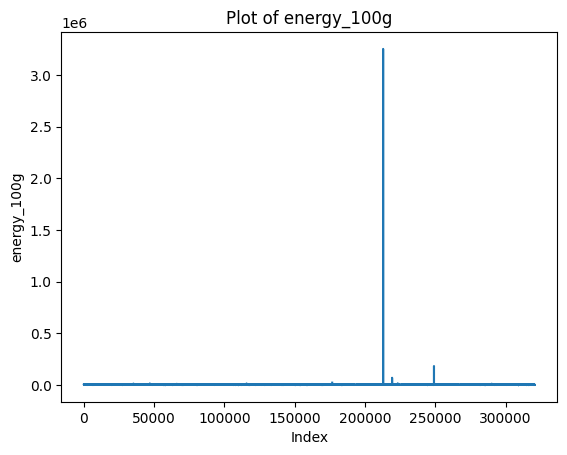

In [38]:
column_name = 'energy_100g'

# Plot the values of the specified column
plt.plot(df3[column_name])

# Add labels and title
plt.xlabel('Index')
plt.ylabel(column_name)
plt.title(f'Plot of {column_name}')

# Show the plot
plt.show()

Supprimons la valeur maximale puis utilisons plotly pour pouvoir analyser les autres valeurs.

In [39]:
df3['energy_100g'].max

# Find the index corresponding to the maximum value in the column
max_index = df3['energy_100g'].idxmax()

# Access the entire row corresponding to the maximum value
df3.loc[max_index]

code                                   3257983143096
created_datetime           2016-06-04 08:31:26+00:00
last_modified_datetime     2017-04-11 17:27:38+00:00
product_name                             Pois cassés
countries                                     France
ingredients_text                        Pois cassés.
nutrition_grade_fr                                 b
energy_100g                                3251373.0
fat_100g                                         1.2
saturated_fat_100g                               0.2
carbohydrates_100g                              48.2
sugars_100g                                      2.5
fiber_100g                                      15.4
proteins_100g                                   22.7
salt_100g                                       0.01
sodium_100g                                 0.003937
nutrition_score_fr_100g                          0.0
Name: 212928, dtype: object

In [40]:
df3 = df3.drop(max_index)

In [41]:
column_name = 'energy_100g'

# Create a scatter plot with index on the x-axis and column values on the y-axis
fig = px.scatter(x=df3.index, y=df3[column_name], 
                 labels={'x': 'Index', 'y': column_name})

# Set plot title
fig.update_layout(title=f"Scatter Plot of {column_name}")

# Show the plot
fig.show()

Inspect the products having energy_100g>5k

In [42]:
df3[df3['energy_100g'] > 5000].head(8)

,code,created_datetime,last_modified_datetime,product_name,countries,ingredients_text,nutrition_grade_fr,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
15660,0019962333026,2017-03-09 14:55:20+00:00,2017-03-09 14:55:20+00:00,Tamalito Candy,US,"Sugar, corn syrup, chilli, iodized salt, citri...",e,5439.0,0.00,0.00,90.00,80.00,0.0,0.00,0.40640,0.160,21.0
35308,0038233241334,2017-03-10 09:39:09+00:00,2017-03-10 09:39:09+00:00,Lemon Cake,US,"Enriched flour (flour, reduced iron, thiamin m...",e,13213.0,12.28,2.63,45.61,29.82,0.0,3.51,0.71374,0.281,21.0
46967,0041390030512,2017-03-09 13:20:13+00:00,2017-03-09 13:20:13+00:00,Instant Aka Miso Soup,US,"Red miso powder(soybeans, rice salt), dehydrat...",e,14644.0,10.00,0.00,40.00,0.00,0.0,20.00,20.06600,7.900,20.0
66156,0056141003103,2017-03-10 09:11:15+00:00,2017-03-10 09:11:16+00:00,"Crema Salvadorena, Soft Blend Dairy Spread",US,"Cultured pasteurized grade a cream and milk, n...",e,10966.0,24.14,13.79,6.90,6.90,0.0,3.45,1.40208,0.552,27.0
104932,0086232314955,2017-03-09 15:18:32+00:00,2017-03-09 15:18:32+00:00,Twin Cherries Lollipops,US,"Sugar glucose syrup, acidifier (citric acid), ...",e,6849.0,0.00,0.00,96.30,74.07,0.0,0.00,0.00000,0.000,20.0
115777,0444444387721,2017-03-09 13:32:21+00:00,2017-03-09 13:32:21+00:00,"Flave!, Assorted Fish",US,"Corn syrup, sugar, modified food starch, high ...",e,14347.0,0.00,0.00,80.95,50.00,0.0,0.00,0.06096,0.024,20.0
128259,0705105834597,2017-03-09 16:03:53+00:00,2017-03-09 16:03:53+00:00,"Dulces Tipicos, Hot Candy Spoon, Tamarind",US,"Sugar, corn syrup, citric acid, iodized salt, ...",e,5439.0,0.00,0.00,90.00,80.00,0.0,0.00,0.40640,0.160,21.0
131974,0714444003120,2017-03-09 12:01:57+00:00,2017-03-09 12:01:57+00:00,Boldo Leaves,US,Star anise seed.,c,6276.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00000,0.000,10.0


In [43]:
df[df['code'] == '0038233241334'].head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,brands,brands_tags,countries,countries_tags,countries_fr,ingredients_text,serving_size,additives_n,additives,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,states,states_tags,states_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
35308,0038233241334,http://world-fr.openfoodfacts.org/produit/0038...,usda-ndb-import,1489138749,2017-03-10T09:39:09Z,1489138749,2017-03-10T09:39:09Z,Lemon Cake,Coffee Baking Co,coffee-baking-co,US,en:united-states,États-Unis,"Enriched flour (flour, reduced iron, thiamin m...",57 g (57 GRM),1.0,[ enriched-flour -> en:enriched-flour ] [ f...,0.0,0.0,e,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",13213.0,12.28,2.63,45.61,29.82,0.0,3.51,0.71374,0.281,21.0,21.0


Looking the available data for this product on the web I found that energy_100g should be 1029. I'll delete this entry. Let's check a product which has a value equal to 1200 in order to see if we find the same data on the web in that case.

In [44]:
df3[df3['energy_100g'] == 1200].head(8)

,code,created_datetime,last_modified_datetime,product_name,countries,ingredients_text,nutrition_grade_fr,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
16748,0021000604654,2015-10-20 18:55:27+00:00,2016-04-02 20:50:43+00:00,Singles White American,United States,"Milk, cheddar chees (milk, cheese culture, sal...",e,1200.0,21.4,11.90,9.52,9.52,0.0,19.0,2.660,1.050000,25.0
57283,0044700008744,2015-02-01 01:09:25+00:00,2015-08-09 17:35:48+00:00,Bologna made with Chicken & Pork,United States,"Mechanically separated chicken, pork, water, c...",e,1200.0,25.0,8.93,3.57,0.00,0.0,10.7,2.270,0.893000,20.0
90384,0075805889136,2015-07-18 02:56:23+00:00,2017-03-09 13:22:40+00:00,Freshly crumbled goat cheese,United States,"Goat cheese crumbles (pasteurized goat milk, c...",d,1200.0,21.4,14.30,10.70,3.57,0.0,17.9,0.726,0.286000,11.0
104942,00862325,2015-01-21 20:00:34+00:00,2015-08-11 18:16:44+00:00,Authentic Greek Feta,United States,NaN,d,1200.0,25.0,14.30,3.57,0.00,0.0,17.9,3.080,1.210000,18.0
187164,3011360005564,2014-03-31 17:37:58+00:00,2015-11-07 07:41:52+00:00,Court-Bouillon Fines herbes et vin blanc (9 Ta...,France,"Sel, graisse de palme, acidifiant : acide citr...",NaN,1200.0,23.0,16.00,7.00,4.50,2.5,5.0,48.000,18.897638,NaN
195408,3154230008026,2012-10-29 12:06:59+00:00,2016-11-20 11:49:38+00:00,Pâte à pizza Ronde et fine,France,"Farine de _blé_, eau, huiles végétales (palme,...",c,1200.0,8.5,3.20,42.80,0.15,2.3,6.6,1.780,0.700787,10.0
195469,3154230084334,2012-07-02 17:16:29+00:00,2017-01-20 14:26:28+00:00,Pâte à pizza Fine et Rectangulaire,France,"Farine de _blé_, eau, huiles végétales (Palme,...",c,1200.0,8.5,3.20,42.80,0.15,2.3,6.6,1.780,0.700787,10.0
204642,3248652686587,2012-04-06 12:42:13+00:00,2015-08-01 19:29:09+00:00,Crème Fluide Entière (30 % MG),France,"Crème de lait, stabilisant : carraghénanes.",d,1200.0,30.0,20.00,3.30,3.30,0.0,2.0,0.100,0.039370,13.0


In [45]:
df[df['code'] == '3154230008026'].head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,brands,brands_tags,countries,countries_tags,countries_fr,ingredients_text,serving_size,additives_n,additives,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,states,states_tags,states_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
195408,3154230008026,http://world-fr.openfoodfacts.org/produit/3154...,stephane,1351512419,2012-10-29T12:06:59Z,1479642578,2016-11-20T11:49:38Z,Pâte à pizza Ronde et fine,Herta,herta,France,en:france,France,"Farine de _blé_, eau, huiles végétales (palme,...",NaN,2.0,[ farine-de-ble -> fr:farine-de-ble ] [ far...,1.0,0.0,c,"en:to-be-checked, en:complete, en:nutrition-fa...","en:to-be-checked,en:complete,en:nutrition-fact...","A vérifier,Complet,Informations nutritionnelle...",1200.0,8.5,3.2,42.8,0.15,2.3,6.6,1.78,0.700787,10.0,10.0


Sur [herta.fr](https://www.herta.fr/produits/pate-a-tarte-pizza/pates-a-pizza-hertar/herta-pate-a-pizza-fine-ronde-265g) on trouve une valeur similaire pour cette pate à pizza (E=1178). Cela nous rassure sur la qualité globale du dataset.

En cherchant quelques autres produits dont E>5000 sur internet on voit que ces valeurs semblent fausses. Supprimons les.

In [46]:
# Create a boolean mask for rows where the value is higher than 5000
mask = df3['energy_100g'] > 5000

# Apply the mask to filter rows
df3 = df3[~mask]

In [47]:
column_name = 'energy_100g'

fig = px.scatter(df3, x=df3.index, y='energy_100g', hover_data=['code']) 


# Set plot title
fig.update_layout(title=f"Scatter Plot of {column_name}")

# Show the plot
fig.show()

En considérant la forùulme utilisée plus bas pour calculer l'énergie on peut fixer une valeur limite à l'énergie pour 100g. Ici fixons cette valeur à 3800 kJ. Le dataset résultant sera notre base pour calculer l'énergie.

In [48]:
mask = df3['energy_100g'] > 3800

# Apply the mask to filter rows
df4 = df3[~mask]

Comparons la taille du dataset initial avec notre dataset nettoyé.

In [49]:
print('initial: ', df_0.shape)
print('final:   ', df4.shape)

initial:  (320772, 162)
final:    (156170, 17)


#### Calcul de l'énergie

Voyons le nombre d'entrées manquantes

In [50]:
df['energy_100g'].isnull().sum()

59659

En utilisant le système Atwater on peut calculer l'énergie en kJ pour 100g de nourriture comme suit : 

energy_100g = (fat_100g×37)+(carbohydrates_100g×17)+(proteins_100g×17)+(fiber_100g×8)

Notons que cette formule est une formule simplifiée. Vérifions qu'elle donne de bons résultats en choisissant une ligne du dataset au hasard.

In [51]:
column_name = 'energy_100g'

# Create a boolean mask for rows where the specified column is not null
not_null_mask = df3[column_name].notnull()

# Filter the DataFrame to include only rows where the specified column is not null
filtered_df = df3[not_null_mask]

# Randomly select a row from the filtered DataFrame
random_row = filtered_df.sample()

# Replace 'column1', 'column2', etc., with the actual names of your columns
selected_columns = ['energy_100g', 'fat_100g', 'carbohydrates_100g', 'proteins_100g', 'fiber_100g']

# Access the values of the specified columns in the randomly selected row
selected_values = random_row[selected_columns]

# Display the result
print(selected_values,'\n')

# Convert the values into a numpy array in order to perform calculations
selected_values_array = selected_values.to_numpy()[0]

# Compute the energy and compare with the value given in the dataset
energy_calc = selected_values_array[1]*37 + selected_values_array[2]*17 + selected_values_array[3]*17 + selected_values_array[4]*8

print('Energie du dataset : ', selected_values_array[0])
print('Energie calculée   : ', energy_calc)

        energy_100g  fat_100g  carbohydrates_100g  proteins_100g  fiber_100g
241408       1110.0       7.0                36.0           12.0         4.5 

Energie du dataset :  1110.0
Energie calculée   :  1111.0


La formule fonctionne bien. Utilisons la désormais pour calculer les valeurs d'énergie manquantes.

In [52]:
df5 = df4.copy()

In [53]:
# Define a custom function to apply the formula
def fill_missing_energy(row):
    if np.isnan(row['energy_100g']):
        # Replace with your formula using values from columns A, B, C, and D
        return row['fat_100g']*37 + row['carbohydrates_100g']*17 + row['proteins_100g']*17 + row['fiber_100g']*8
    else:
        return row['energy_100g']

# Apply the custom function to fill missing values in the specified column
df5['energy_100g'] = df5.apply(fill_missing_energy, axis=1)


In [54]:
nan_percentage_by_columns(df5)

code                       0.00 %
created_datetime           0.00 %
last_modified_datetime     0.00 %
product_name               1.26 %
countries                  0.01 %
ingredients_text           3.61 %
nutrition_grade_fr         0.28 %
energy_100g                0.00 %
fat_100g                   0.00 %
saturated_fat_100g         0.00 %
carbohydrates_100g         0.00 %
sugars_100g                0.00 %
fiber_100g                 0.00 %
proteins_100g              0.00 %
salt_100g                  0.00 %
sodium_100g                0.00 %
nutrition_score_fr_100g    0.28 %
dtype: object

#### Détermination du nutri-score et du nutri-grade

Connaissant l'énergie, nous pouvons désormais déterminer le nutri-score puis le nutri-grade en utilisant la méthode décrite dans l'image ci dessous.

![image](https://www.researchgate.net/profile/Hassan-Aguenaou-2/publication/328136107/figure/fig1/AS:679251904835597@1538957682395/Calcul-de-lalgorithme-du-Nutri-Score-le-score-FRSm-HCSP.ppm)

Pour simplifier nous considérons uniquement les colonnes rouges pour les points A et nous ne nous intéressons pas à la teneur en fruits et légumes de sorte que le nutriscore final N est toujours donné par N = A - C.

In [55]:
# Fonction pour calculer le nutriscore
def calculate_nutriscore_nutrigrade(energy_100g, saturated_fat_100g, sugars_100g, fiber_100g, proteins_100g, sodium_100g):
    # Points pour les nutriments à limiter (points A)
    points_limitants = 0

    if energy_100g <= 335:
        points_limitants += 0
    elif 335 < energy_100g <= 670:
        points_limitants += 1
    elif 670 < energy_100g <= 1005:
        points_limitants += 2
    elif 1005 < energy_100g <= 1340:
        points_limitants += 3
    elif 1340 < energy_100g <= 1675:
        points_limitants += 4
    elif 1675 < energy_100g <= 2010:
        points_limitants += 5
    elif 2010 < energy_100g <= 2345:
        points_limitants += 6
    elif 2345 < energy_100g <= 2680:
        points_limitants += 7
    elif 2680 < energy_100g <= 3015:
        points_limitants += 8
    elif 3015 < energy_100g <= 3350:
        points_limitants += 9
    elif energy_100g > 3350:
        points_limitants += 10

    if sugars_100g <= 4.5:
        points_limitants += 0
    elif 4.5 < sugars_100g <= 9:
        points_limitants += 1
    elif 9 < sugars_100g <= 13.5:
        points_limitants += 2
    elif 13.5 < sugars_100g <= 18:
        points_limitants += 3
    elif 18 < sugars_100g <= 22.5:
        points_limitants += 4
    elif 22.5 < sugars_100g <= 27:
        points_limitants += 5
    elif 27 < sugars_100g <= 31:
        points_limitants += 6
    elif 31 < sugars_100g <= 36:
        points_limitants += 7
    elif 36 < sugars_100g <= 40:
        points_limitants += 8
    elif 40 < sugars_100g <= 45:
        points_limitants += 9
    elif sugars_100g > 45:
        points_limitants += 10

    if saturated_fat_100g <= 1:
        points_limitants += 0
    elif 1 < saturated_fat_100g <= 2:
        points_limitants += 1
    elif 2 < saturated_fat_100g <= 3:
        points_limitants += 2
    elif 3 < saturated_fat_100g <= 4:
        points_limitants += 3
    elif 4 < saturated_fat_100g <= 5:
        points_limitants += 4
    elif 5 < saturated_fat_100g <= 6:
        points_limitants += 5
    elif 6 < saturated_fat_100g <= 7:
        points_limitants += 6
    elif 7 < saturated_fat_100g <= 8:
        points_limitants += 7
    elif 8 < saturated_fat_100g <= 9:
        points_limitants += 8
    elif 9 < saturated_fat_100g <= 10:
        points_limitants += 9
    elif saturated_fat_100g > 10:
        points_limitants += 10

    if sodium_100g <= 90:
        points_limitants += 0
    elif 90 < sodium_100g <= 180:
        points_limitants += 1
    elif 180 < sodium_100g <= 270:
        points_limitants += 2
    elif 270 < sodium_100g <= 360:
        points_limitants += 3
    elif 360 < sodium_100g <= 450:
        points_limitants += 4
    elif 450 < sodium_100g <= 540:
        points_limitants += 5
    elif 540 < sodium_100g <= 630:
        points_limitants += 6
    elif 630 < sodium_100g <= 720:
        points_limitants += 7
    elif 720 < sodium_100g <= 810:
        points_limitants += 8
    elif 810 < sodium_100g <= 900:
        points_limitants += 9
    elif sodium_100g > 900:
        points_limitants += 10

    
    # Points pour les nutriments à favoriser (points C)
    points_favorables = 0

    if fiber_100g <= 0.7:
        points_favorables += 0
    elif 0.7 <= fiber_100g <= 1.4:
        points_favorables += 1
    elif 1.4 <= fiber_100g <= 2.1:
        points_favorables += 2
    elif 2.1 <= fiber_100g <= 2.8:
        points_favorables += 3
    elif 2.8 <= fiber_100g <= 3.5:
        points_favorables += 4
    elif fiber_100g > 3.5:
        points_favorables += 5
    
    if proteins_100g <= 1.6:
        points_favorables += 0
    elif 1.6 <= proteins_100g <= 3.2:
        points_favorables += 1
    elif 3.2 <= proteins_100g <= 4.8:
        points_favorables += 2
    elif 4.8 <= proteins_100g <= 6.4:
        points_favorables += 3
    elif 6.4 <= proteins_100g <= 8.0:
        points_favorables += 4
    elif proteins_100g > 8.0:
        points_favorables += 5
    
    # Calcul du Nutri-Score final
    nutriscore = points_limitants - points_favorables
    
    # Calcul du Nutri-Grade final
    if nutriscore <= -1:
        nutrigrade = 'a'
    elif -1<nutriscore<=2:
        nutrigrade = 'b'
    elif 2<nutriscore<=10:
        nutrigrade = 'c'
    elif 10<nutriscore<=18:
        nutrigrade = 'd'
    elif 18<nutriscore:
        nutrigrade = 'e'
    else:
        print('There was an error during the nutriscore calculation.')
    
    return [nutriscore, nutrigrade]

In [56]:
# Exemple d'utilisation
columns = ['energy_100g', 'saturated_fat_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 
           'nutrition_score_fr_100g', 'nutrition_grade_fr']

# Get a random row
random_row = df5.sample()

# Extract values of columns for the random row
values = random_row[columns].values

# If you want the values as a list, you can flatten the array
values_list = values.flatten().tolist()

ingredients = values_list[:-2]
expected_nutriscore = values_list[-2]
expected_nutrigrade = values_list[-1]

energy_100g, saturated_fat_100g, sugars_100g, fiber_100g, proteins_100g, sodium_100g = ingredients
result = calculate_nutriscore_nutrigrade(energy_100g, saturated_fat_100g, sugars_100g, fiber_100g, proteins_100g, sodium_100g)

# Print or use the values as needed
print(ingredients)
print(f"Expected Nutri-Score: {expected_nutriscore}")
print(f"Expected Nutri-Grade: {expected_nutrigrade}")

print(f"Calculated Nutri-Score: {result[0]}")
print(f"Calculated Nutri-Grade: {result[1]}")

[75.0, 0.0, 0.88, 0.9, 0.88, 0.664]
Expected Nutri-Score: 6.0
Expected Nutri-Grade: c
Calculated Nutri-Score: -1
Calculated Nutri-Grade: a


In [57]:
# Functions to fill missing nutriscores and nutrigrades
def fill_missing_nutriscore(row):
    if np.isnan(row['nutrition_score_fr_100g']):
        columns = ['energy_100g', 'saturated_fat_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g']
        values = row[columns].values
        energy_100g, saturated_fat_100g, sugars_100g, fiber_100g, proteins_100g, sodium_100g = values.flatten().tolist()
        return calculate_nutriscore_nutrigrade(energy_100g, saturated_fat_100g, sugars_100g, fiber_100g, proteins_100g, sodium_100g)[0]
    else:
        return row['nutrition_score_fr_100g']

def fill_missing_nutrigrade(row):
    if pd.isnull(row['nutrition_grade_fr']):
        columns = ['energy_100g', 'saturated_fat_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g']
        values = row[columns].values
        energy_100g, saturated_fat_100g, sugars_100g, fiber_100g, proteins_100g, sodium_100g = values.flatten().tolist()
        return calculate_nutriscore_nutrigrade(energy_100g, saturated_fat_100g, sugars_100g, fiber_100g, proteins_100g, sodium_100g)[1]
    else:
        return row['nutrition_grade_fr']

In [58]:
df5.isnull().sum()

code                          0
created_datetime              1
last_modified_datetime        0
product_name               1971
countries                    18
ingredients_text           5635
nutrition_grade_fr          430
energy_100g                   0
fat_100g                      0
saturated_fat_100g            0
carbohydrates_100g            0
sugars_100g                   0
fiber_100g                    0
proteins_100g                 0
salt_100g                     0
sodium_100g                   0
nutrition_score_fr_100g     430
dtype: int64

In [59]:
# Apply the custom function to fill missing values in the specified columns
df5['nutrition_score_fr_100g'] = df5.apply(fill_missing_nutriscore, axis=1)
df5['nutrition_grade_fr'] = df5.apply(fill_missing_nutrigrade, axis=1)

In [60]:
nan_percentage_by_columns(df5)

code                       0.00 %
created_datetime           0.00 %
last_modified_datetime     0.00 %
product_name               1.26 %
countries                  0.01 %
ingredients_text           3.61 %
nutrition_grade_fr         0.00 %
energy_100g                0.00 %
fat_100g                   0.00 %
saturated_fat_100g         0.00 %
carbohydrates_100g         0.00 %
sugars_100g                0.00 %
fiber_100g                 0.00 %
proteins_100g              0.00 %
salt_100g                  0.00 %
sodium_100g                0.00 %
nutrition_score_fr_100g    0.00 %
dtype: object

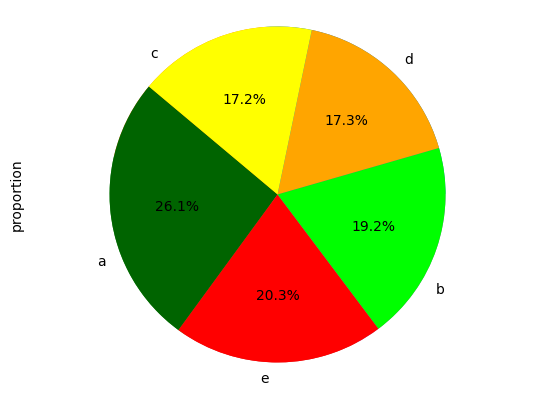

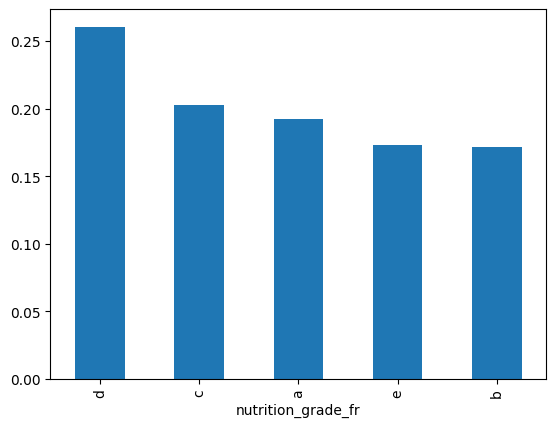

In [61]:
# Diagramme en secteurs
df5["nutrition_grade_fr"].value_counts(normalize=True).plot(kind='pie')
colors = ['#006400', '#FF0000', '#00FF00', '#FFA500', '#FFFF00']  # dark green, red, light green, orange, yellow
# Plot
plt.pie(df5["nutrition_grade_fr"].value_counts(normalize=True), colors=colors, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
plt.show() # Affiche le graphique

# Diagramme en tuyaux d'orgues
df5["nutrition_grade_fr"].value_counts(normalize=True).plot(kind='bar')
plt.show()

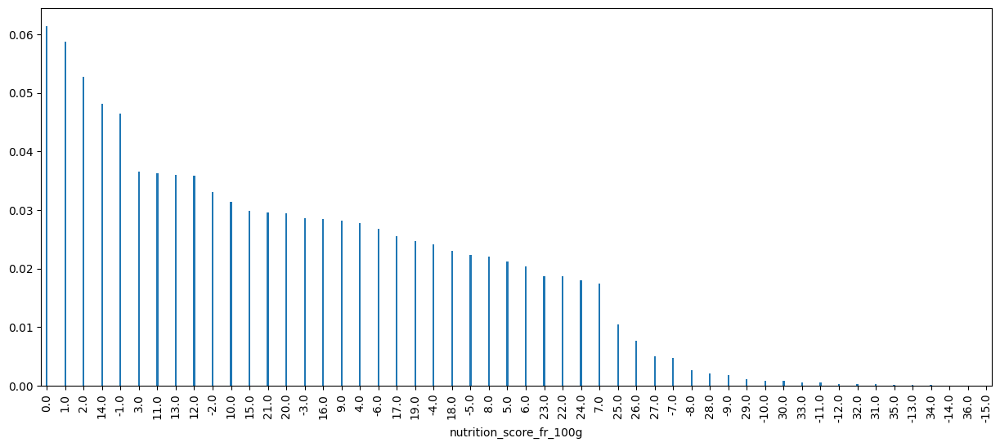

In [62]:
# Diagramme en bâtons
plt.figure(figsize=(15, 6))
df5["nutrition_score_fr_100g"].value_counts(normalize=True).plot(kind='bar',width=0.1)
plt.show()

In [63]:
df5[df5['nutrition_score_fr_100g']==-14.]

,code,created_datetime,last_modified_datetime,product_name,countries,ingredients_text,nutrition_grade_fr,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g
199759,3222471016886,2015-04-28 21:40:18+00:00,2016-04-17 17:10:48+00:00,Choux-fleurs en fleurettes,France,100% choux-fleurs,a,293.0,2.0,0.5,4.7,4.1,3.6,6.5,0.0200,0.007874,-14.0
210784,3256223662106,2016-09-15 17:15:33+00:00,2017-03-28 10:18:20+00:00,Lentilles corail bio,France,NaN,a,485.0,1.3,0.2,12.4,1.1,8.0,9.7,0.0000,0.000000,-14.0
218804,3270160103713,2015-02-28 18:18:43+00:00,2016-09-03 15:52:42+00:00,Fèves pelées,France,Fève pelée,a,437.0,0.8,0.1,12.0,1.1,5.4,9.4,0.0400,0.015748,-14.0
279242,5411788045094,2012-06-02 11:59:46+00:00,2013-02-11 21:57:59+00:00,Edamamé Beans Nature,France,"Edamamé (soja), Eau",a,461.0,6.4,1.0,2.4,1.0,3.6,10.8,0.0762,0.030000,-14.0
311235,8480000610232,2016-12-29 22:39:55+00:00,2017-01-04 15:49:52+00:00,Edamame,España,Vainas de _soja_ verde. _Contiene soja_.,a,547.0,4.0,0.6,10.0,2.2,5.2,11.0,0.1600,0.062992,-14.0


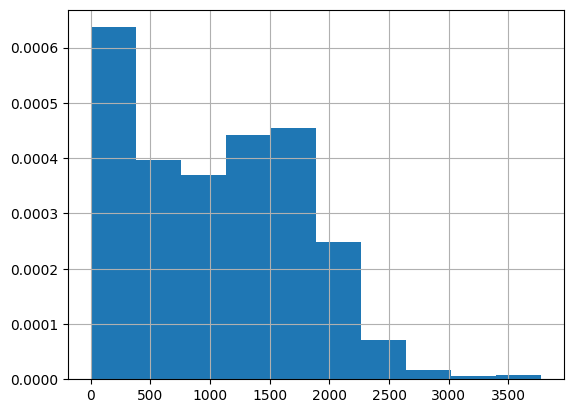

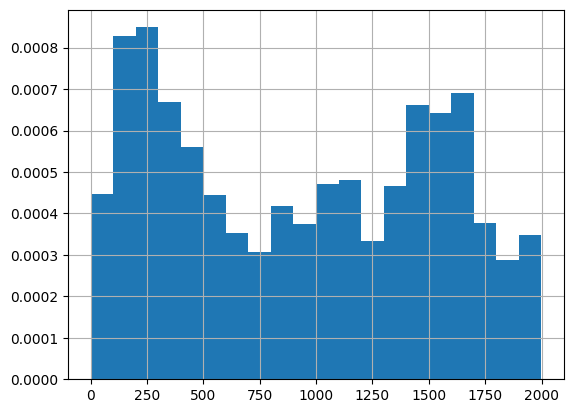

In [64]:
# Histogramme
df5["energy_100g"].hist(density=True)
plt.show()

# Histogramme plus beau
df5[df5.energy_100g.abs() < 2000]["energy_100g"].hist(density=True,bins=20)
plt.show()

### Comblage des valeurs manquantes par méthodes statistiques

Reprenons le dataset d'origine et remplaçons les valeurs manquantes que nous avons calculé

In [ ]:
df6 = df_0.copy()

In [ ]:
threshold = 0.5 * len(df6)
df6 = df6.dropna(axis=1, thresh=threshold)

In [ ]:
# Rename 'saturated-fat' and 'nutrition-score-fr_100g' for convenience
df6 = df6.rename(columns={"saturated-fat_100g": "saturated_fat_100g", 
                         'nutrition-score-fr_100g': 'nutrition_score_fr_100g'})

In [ ]:
df6.update(df5)

In [ ]:
nan_percentage_by_columns(df6)

In [ ]:
# Let's keep the column 'pnns_groups_1' for later
column_name_to_add = 'pnns_groups_1'

# Extract the desired column from df0
new_column = df_0[column_name_to_add]

# Concatenate df6 and the extracted column
df_merged = pd.concat([df6, new_column], axis=1)
df7 = df_merged

In [ ]:
nan_percentage_by_columns(df7)

In [ ]:
# Diagramme en secteurs
df7["pnns_groups_1"].value_counts(normalize=True).plot(kind='pie')
# Cette ligne assure que le pie chart est un cercle plutôt qu'une éllipse
plt.axis('equal') 
plt.show() # Affiche le graphique


Suppression des colonnes inutiles

In [ ]:
df7.columns

In [ ]:
columns_to_remove = ['code', 'url', 'creator', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'brands',
       'brands_tags', 'countries_tags', 'countries_fr',
       'ingredients_text', 'serving_size', 'additives_n', 'additives',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'states', 'states_tags', 'states_fr', 'nutrition-score-uk_100g']

df7 = df7.drop(columns=columns_to_remove)

In [ ]:
nan_percentage_by_columns(df7)

In [ ]:
your_column_name = 'energy_100g'

# Check if the values in the specified column are lower than zero
values_lower_than_zero = df7[your_column_name] < 0

# Display the rows where the values are lower than zero
rows_with_values_lower_than_zero = df7[values_lower_than_zero]

# Print the result
print(f"Rows with values lower than zero in '{your_column_name}':")
print(rows_with_values_lower_than_zero)


In [ ]:
df7.columns

In [ ]:
nan_percentage_by_columns(df7)

In [ ]:
# Assuming column_names is a list of columns to process
column_names = ['fat_100g', 'saturated_fat_100g', 'carbohydrates_100g', 'sugars_100g', 
                'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g']

# Set values outside the range [0, 100] to NaN
for col in column_names:
    df7[col] = df7[col].mask((df7[col] < 0) | (df7[col] > 100))

In [ ]:
nan_percentage_by_columns(df7)

In [ ]:
# Remove rows where 'energy_100g' is greater than 3800
df7 = df7[df7['energy_100g'] <= 3800]

In [ ]:
df7.info()

In [ ]:
df7['created_t'] = pd.to_datetime(df7['created_t'], unit='s', errors='coerce')

In [ ]:
# Replace null values in 'fiber_100g' with zero
df7['fiber_100g'].fillna(0, inplace=True)

In [ ]:
# Remove lines where the sum of nutriments is higher than 100 and keep nan values
df7 = df7.query('(fat_100g + carbohydrates_100g + fiber_100g + proteins_100g + salt_100g <= 100) or (fat_100g.isna() | carbohydrates_100g.isna() | fiber_100g.isna() | proteins_100g.isna() | salt_100g.isna())')

In [ ]:
nan_percentage_by_columns(df7)

In [ ]:
fig = px.box(df7, x='nutrition_grade_fr', y='fat_100g', hover_data=['product_name', 'pnns_groups_1'])
fig.show()

In [ ]:
df7.columns

In [ ]:
df100g = df7.drop(columns=['created_t', 'product_name', 'countries', 'nutrition_grade_fr',
       'energy_100g', 'nutrition_score_fr_100g', 'pnns_groups_1'])

# Reshape the DataFrame into long-form
df_long = pd.melt(df100g, var_name='Columns', value_name='Values')

# Create box plot using plotly express
fig = px.box(df_long, x='Columns', y='Values',
             labels={'Values': 'Values', 'Columns': 'Columns'},
             title='Boxplot des nutriments')


# Show the plot
fig.show()

In [ ]:
df100g = df7.drop(columns=['created_t', 'countries', 'nutrition_grade_fr',
                           'energy_100g', 'nutrition_score_fr_100g'])

# Reshape the DataFrame into long-form
df_long = pd.melt(df100g, id_vars=['product_name', 'pnns_groups_1'], var_name='Columns', value_name='Values')

# Create box plot using plotly express
fig = px.box(df_long, x='Columns', y='Values', color='pnns_groups_1',
             labels={'Values': 'Values', 'Columns': 'Columns'},
             title='Boxplot des nutriments',
             hover_data=['product_name', 'pnns_groups_1'])

# Show the plot
fig.show()


In [ ]:
df100g = df7.drop(columns=['created_t', 'countries', 'nutrition_grade_fr',
                           'energy_100g', 'nutrition_score_fr_100g'])

# Reshape the DataFrame into long-form
df_long = pd.melt(df100g, id_vars=['product_name', 'pnns_groups_1'], var_name='Columns', value_name='Values')

# Create box plot using plotly express
fig = px.box(df_long, x='Columns', y='Values',
             labels={'Values': 'Values', 'Columns': 'Columns'},
             title='Boxplot des nutriments',
             hover_data=['product_name', 'pnns_groups_1'])

# Show the plot
fig.show()


In [ ]:
df7.info()

In [ ]:
df7.columns

In [ ]:
df8 = df7.copy()

In [ ]:
# Specify the columns you want to impute
columns_to_impute = ['fat_100g', 'saturated_fat_100g', 'carbohydrates_100g', 
                     'sugars_100g', 'proteins_100g', 'salt_100g', 'sodium_100g']

# Create a KNNImputer object
imputer = KNNImputer(n_neighbors=5)

# Impute missing values for selected columns
df8[columns_to_impute] = imputer.fit_transform(df8[columns_to_impute])

In [ ]:
# Apply the custom function to fill missing values in the specified columns
df8['nutrition_score_fr_100g'] = df8.apply(fill_missing_nutriscore, axis=1)
df8['nutrition_grade_fr'] = df8.apply(fill_missing_nutrigrade, axis=1)

In [ ]:
nan_percentage_by_columns(df8)

In [ ]:
msno.matrix(df8)

In [ ]:
df8.to_csv('P2_data_cleaned.csv', index=False)

In [ ]:
df100g = df8.drop(columns=['created_t', 'countries', 'nutrition_grade_fr',
                           'energy_100g', 'nutrition_score_fr_100g'])

# Reshape the DataFrame into long-form for plot
df_long = pd.melt(df100g, id_vars=['product_name', 'pnns_groups_1'], var_name='Columns', value_name='Values')

# Create box plot using plotly express
fig = px.box(df_long, x='Columns', y='Values',
             labels={'Values': 'Values', 'Columns': 'Columns'},
             title='Boxplot des nutriments',
             hover_data=['product_name', 'pnns_groups_1'])

# Show the plot
fig.show()

## Nettoyage automatique

In [ ]:
def preprocessing(df):
    """Cette fonction prend le jeu de données initial en entrée 
    et retourne le jeu de données nettoyé."""
    ### I - SELECTIONS DES DONNEES UTILES
    # Suppression des colonnes avec +50% de NaN
    df1 = df.dropna(axis=1, thresh=0.5 * len(df))
    # Récupération de la colonne 'pnns_groups_2'
    df1 = pd.concat([df1, df['pnns_groups_2']], axis=1)
    # Gardons les colonnes relevantes pour le nutriscore
    df1 = df1[['code', 'created_t',\
            'product_name','countries_fr','ingredients_text',\
            'nutrition_grade_fr','energy_100g','fat_100g',\
            'saturated-fat_100g','carbohydrates_100g','sugars_100g',\
            'fiber_100g','proteins_100g','salt_100g',\
            'sodium_100g','nutrition-score-fr_100g', 'pnns_groups_2']]
    # Renommons les colonnes qui ont des tirets
    df1 = df1.rename(columns={"saturated-fat_100g": "saturated_fat_100g", 
                         'nutrition-score-fr_100g': 'nutrition_score_fr_100g'})
    # Suppression des lignes ayant NaN comme code-barre
    df1 = df1.dropna(subset=['code'])
    # Conversion des dates
    df1['created_t'] = pd.to_datetime(df1['created_t'], unit='s')
    # Supression des valeurs aberrantes pour l'énergie
    df1 = df1[df1['energy_100g']<=3800]

    ### II - CALCUL DIRECT DU NUTRISCORE
    df2 = df1.copy()
    # Gardons uniquement les données non-NaN qui ne sont pas aberrantes
    df2 = df2.query('0 <= fat_100g <= 100 \
                and 0 <= saturated_fat_100g <= 100 \
                and 0 <= carbohydrates_100g <= 100 \
                and 0 <= sugars_100g <= 100 \
                and 0 <= fiber_100g <= 100 \
                and 0 <= proteins_100g <= 100 \
                and 0 <= salt_100g <= 100 \
                and 0 <= sodium_100g <= 100 \
                and fat_100g+carbohydrates_100g+fiber_100g+proteins_100g+salt_100g <= 100')
    # Calcul du nutriscore et détermination du nutrigrade
    df2['nutrition_score_fr_100g'] = df2.apply(fill_missing_nutriscore, axis=1)
    df2['nutrition_grade_fr'] = df2.apply(fill_missing_nutrigrade, axis=1)
    
    ### III - KNN Imputing
    # Reprenons df1 et remplaçons les valeurs déterminées dans II
    df3 = df1.copy()
    df3.update(df2) 
    # Assignons NaN aux valeurs aberrantes des nutriments
    column_names = ['fat_100g', 'saturated_fat_100g', 'carbohydrates_100g', 'sugars_100g', 
                    'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g']
    # Set values outside the range [0, 100] to NaN
    for col in column_names:
        df3[col] = df3[col].mask((df3[col] < 0) | (df3[col] > 100))
    # Remplacment des valeurs manquantes en fibre par zéro
    df3['fiber_100g'].fillna(0, inplace=True)
    # KNN Imputing
    columns_to_impute = ['fat_100g', 'saturated_fat_100g', 'carbohydrates_100g', 
                     'sugars_100g', 'proteins_100g', 'salt_100g', 'sodium_100g']
    imputer = KNNImputer(n_neighbors=5)
    df3[columns_to_impute] = imputer.fit_transform(df3[columns_to_impute])
    # Apply the custom function to fill missing values in the specified columns
    df3['nutrition_score_fr_100g'] = df3.apply(fill_missing_nutriscore, axis=1)
    df3['nutrition_grade_fr'] = df3.apply(fill_missing_nutrigrade, axis=1)

    ### SAVE
    df1.to_csv('P2_data_relevant.csv', index=False)
    df2.to_csv('P2_data_cleaned_by_calculation.csv', index=False)
    df3.to_csv('P2_data_cleaned_auto.csv', index=False)
    
    return df3

In [10]:
import pandas as pd

In [18]:
df_dirty = pd.read_csv("P2_data.csv", low_memory=False, delimiter='\t')

In [3]:
df0 = df_dirty.copy()

In [11]:
df_cleaned = pd.read_csv("P2_data_cleaned.csv")

In [12]:
dfc = df_cleaned.copy()

In [13]:
dfc.head()

,created_t,product_name,countries,nutrition_grade_fr,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition_score_fr_100g,pnns_groups_1
0,2017-03-09 10:33:36,Organic Polenta,US,a,1552.0,1.430,1.14,77.14,4.428,5.7,8.57,0.849512,0.334454,-5.0,NaN
1,2017-03-09 10:33:36,Breadshop Honey Gone Nuts Granola,US,a,1933.0,18.270,1.92,63.46,11.540,7.7,13.46,0.431220,0.169772,-2.0,NaN
2,2017-03-09 10:35:44,Organic Long Grain White Rice,US,c,1490.0,0.444,0.00,80.00,32.000,0.0,8.89,0.024660,0.011907,6.0,NaN
3,2017-03-09 10:33:36,Organic Dark Chocolate Minis,US,d,2406.0,37.500,22.50,55.00,42.500,7.5,5.00,0.247520,0.097449,18.0,NaN
4,2017-03-09 10:33:36,Organic Sunflower Oil,US,d,3586.0,100.000,7.14,0.00,0.000,0.0,0.00,0.000000,0.000000,17.0,NaN


In [19]:
df_dirty.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Columns: 162 entries, code to water-hardness_100g
dtypes: float64(106), object(56)
memory usage: 396.5+ MB


In [21]:
df_dirty = df_dirty.rename(columns={"saturated-fat_100g": "saturated_fat_100g", 
                         'nutrition-score-fr_100g': 'nutrition_score_fr_100g'})

In [20]:
dfc.columns

Index(['created_t', 'product_name', 'countries', 'nutrition_grade_fr',
       'energy_100g', 'fat_100g', 'saturated_fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition_score_fr_100g', 'pnns_groups_1'],
      dtype='object')

In [22]:
df_relevant = df_dirty[['created_t', 'product_name', 'countries', 'nutrition_grade_fr',
       'energy_100g', 'fat_100g', 'saturated_fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition_score_fr_100g', 'pnns_groups_1']]

In [16]:
dfc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239602 entries, 0 to 239601
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   created_t                239602 non-null  object 
 1   product_name             236327 non-null  object 
 2   countries                239538 non-null  object 
 3   nutrition_grade_fr       239602 non-null  object 
 4   energy_100g              239602 non-null  float64
 5   fat_100g                 239602 non-null  float64
 6   saturated_fat_100g       239602 non-null  float64
 7   carbohydrates_100g       239602 non-null  float64
 8   sugars_100g              239602 non-null  float64
 9   fiber_100g               239602 non-null  float64
 10  proteins_100g            239602 non-null  float64
 11  salt_100g                239602 non-null  float64
 12  sodium_100g              239602 non-null  float64
 13  nutrition_score_fr_100g  239602 non-null  float64
 14  pnns

<Axes: >

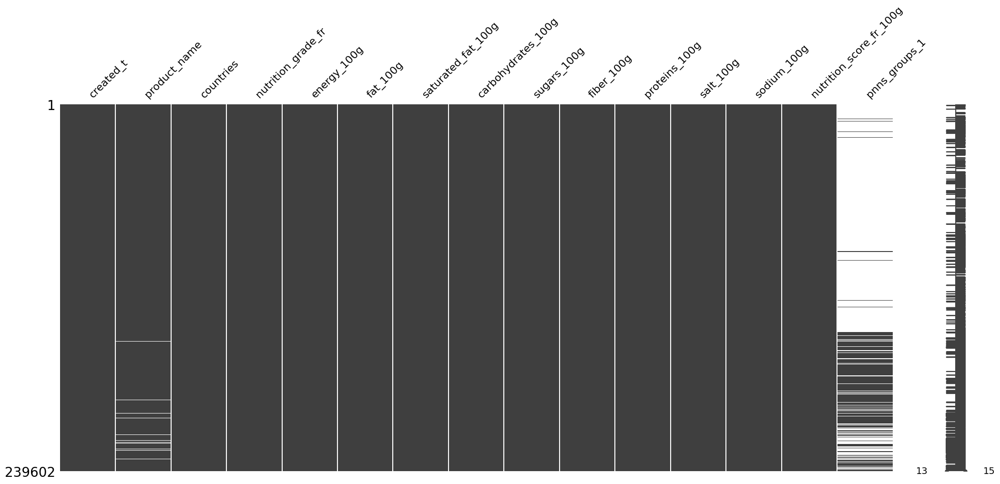

In [14]:
msno.matrix(dfc)

<Axes: >

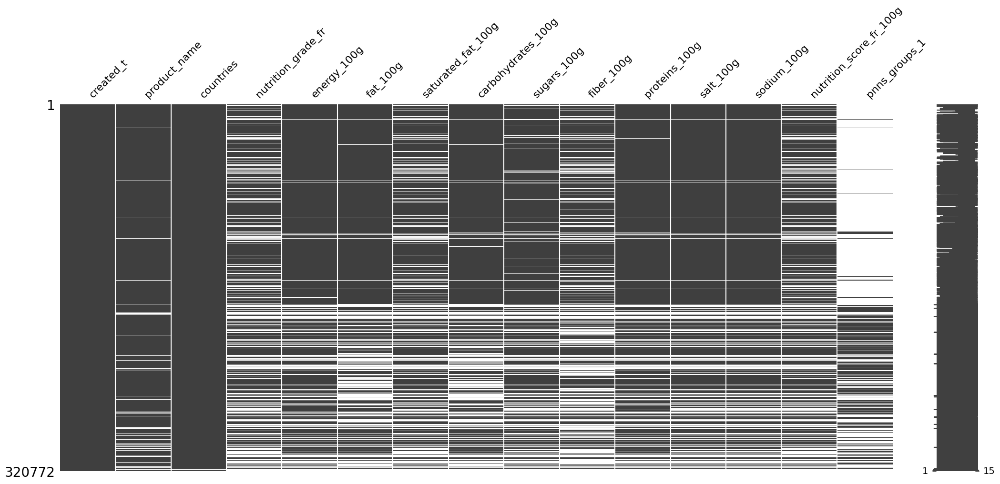

In [23]:
msno.matrix(df_relevant)

In [7]:
from functions_module import test_fct

In [10]:
a = test_fct()

In [11]:
print(a)

12
